# Домашнее задание 3. VAE + NF + VAPNEV

### Загрузка данных
В данном задании вам предстоит снова работать с CelebA

Решением домашки является архив с использованными тетрадками/модулями, а так же .pdf файл с отчетом по проделанной работе по каждому пункту задачи. В нем необходимо описать какие эксперименты вы производили чтобы получить результат который вы получили, а так же обосновать почему вы решили использовать штуки которые вы использовали (например, дополнительные лоссы для стабилизации, разные виды потоков, разные хаки для вае)



In [ ]:
# # Для работы в колабе раскоменьте эти строки
# !git clone https://github.com/HSE-LAMBDA/DeepGenerativeModels.git/tree/spring-2025-DSBA/seminars/seminar-7-nf/
# %cd DeepGenerativeModels/

Cloning into 'seminar-7-nf'...
fatal: repository 'https://github.com/HSE-LAMBDA/DeepGenerativeModels.git/tree/spring-2025-DSBA/seminars/seminar-7-nf/' not found


In [13]:
#!g1.1
from celeba import CelebADataset
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import math
from tqdm.auto import trange, tqdm
import os 
from torch import nn

from torch import Tensor

In [14]:
#!g1.1
t_normalize = lambda x: x * 2 - 1
t_invnormalize = lambda x: (x + 1) / 2
transform=transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    t_normalize,
])

In [16]:
#!g1.1
from random import randint
from celeba_1 import CelebADataset as CelebADataset1

class CelebaCustomDataset(CelebADataset1):
    def __getitem__(self, idx):
        image, target = super().__getitem__(idx)
        return image, target



dataset = CelebaCustomDataset(
    transform=transform,
    root_dir='data'
)

# img = dataset[0]
# img.shape

Good work
Here
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
b

In [ ]:
print(torch.min(dataset[0]).item())

-1.0


In [ ]:
print(dataset[0].shape)

torch.Size([3, 64, 64])


### Визуализация датасета

In [ ]:
#!g1.1
def plot_img(img, transform):
    plt.imshow(transform(img).permute(1, 2, 0))
    plt.axis('off')

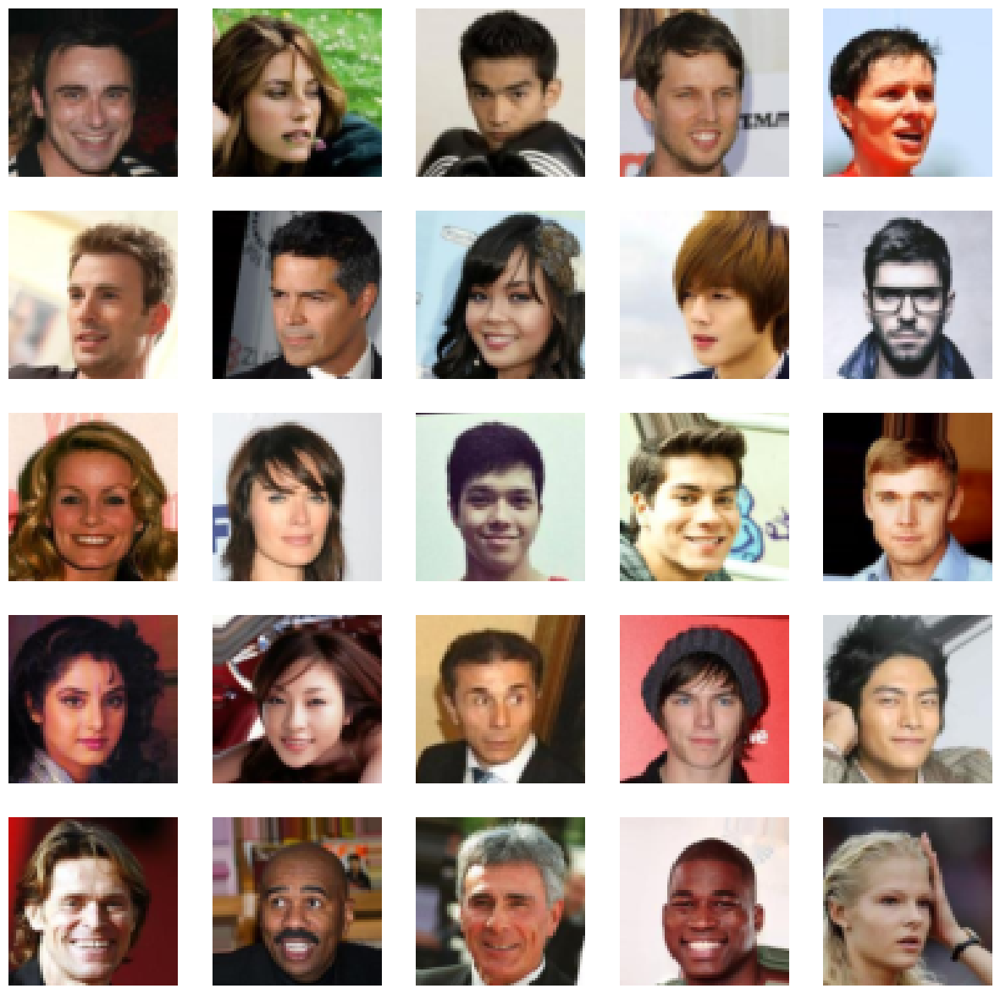

In [ ]:
#!g1.1
plt.figure(figsize=(15, 15))

for i in range(25):
    img = dataset[np.random.randint(len(dataset))]
    plt.subplot(5, 5, i + 1)
    plot_img(img, t_invnormalize)
plt.show()

### Задача 1 (4/10 балла). Построить и обучить нормпоток на CelebA

Здесь нужно обучить нормпоток до нормального (трешхолды будут позже) качества, померить FID и Negative Log Likelihood и запомнить для будущего сравнения

Внутри потока можно использовать все что вы хотите, Coupling/Autoregressive/Linear слои, любые трансформации и все что вам приходит в голову. Но все что вы используете - напишите сами, без копипаста.

Можно использовать как и сверточные потоки (будут лучше, но сложнее писать), так и линейные (будут хуже), развернув селебу в один вектор.

В принципе можно использовать тот код который уже есть в репозитории курса, но лучше написать свой

In [3]:
import itertools
 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.optim as optim
import torch.nn.functional as F
import torch.nn.init as init
from torch import nn
from torch import distributions
from torch.distributions import MultivariateNormal, Uniform, TransformedDistribution, SigmoidTransform
from torch.nn.parameter import Parameter

In [1]:
from nflib.flows import (
    AffineConstantFlow, ActNorm, AffineHalfFlow, 
    SlowMAF, MAF, IAF, Invertible1x1Conv,
    NormalizingFlow, NormalizingFlowModel,
)
from nflib.spline_flows import NSF_AR, NSF_CL

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

In [55]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Normal

class MLP(nn.Module):
    """Basic MLP network for NSF_CL"""
    def __init__(self, in_dim, out_dim, hidden_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, out_dim)
        
    def forward(self, x):
        return self.net(x)

def unconstrained_RQS(x, W, H, D, inverse=False, tail_bound=3.0):
    """Rational quadratic spline (from Durkan et al. 2019)"""
    # Implementation from https://github.com/bayesiains/nsf
    # (Adapted for our needs)
    pass

class SpatialNSF_CL(nn.Module):
    """Neural spline flow coupling layer for images"""
    
    def __init__(self, channels=3, height=64, width=64, K=8, B=3, hidden_channels=64):
        super().__init__()
        self.channels = channels
        self.height = height
        self.width = width
        self.K = K
        self.B = B
        
        # Split channels - for 3 channels we'll use 1 vs 2 split
        self.split1 = channels // 3
        self.split2 = channels - self.split1
        
        # Spatial networks (using small CNNs)
        self.f1 = nn.Sequential(
            nn.Conv2d(self.split1, hidden_channels, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(hidden_channels, hidden_channels, 1),
            nn.ReLU(),
            nn.Conv2d(hidden_channels, (3*K-1)*self.split2, 3, padding=1)
        )
        
        self.f2 = nn.Sequential(
            nn.Conv2d(self.split2, hidden_channels, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(hidden_channels, hidden_channels, 1),
            nn.ReLU(),
            nn.Conv2d(hidden_channels, (3*K-1)*self.split1, 3, padding=1)
        )

    def forward(self, x):
        """Forward pass: x -> z, log_det"""
        batch_size = x.shape[0]
        log_det = torch.zeros(batch_size, device=x.device)
        
        # Split input
        lower = x[:, :self.split1]
        upper = x[:, self.split1:]
        
        # Transform upper conditioned on lower
        params = self.f1(lower)  # [batch, (3K-1)*split2, H, W]
        params = params.view(batch_size, self.split2, (3*self.K-1), self.height, self.width)
        
        # Split parameters
        W, H, D = torch.split(params, self.K, dim=2)  # each [batch, split2, K, H, W]
        W, H = torch.softmax(W, dim=2), torch.softmax(H, dim=2)
        W, H = 2*self.B*W, 2*self.B*H
        D = F.softplus(D)
        
        # Flatten spatial dimensions
        upper = upper.permute(0, 2, 3, 1).reshape(-1, self.split2)  # [batch*H*W, split2]
        W = W.permute(0, 3, 4, 1, 2).reshape(-1, self.split2, self.K)
        H = H.permute(0, 3, 4, 1, 2).reshape(-1, self.split2, self.K)
        D = D.permute(0, 3, 4, 1, 2).reshape(-1, self.split2, self.K)
        
        # Apply transformation
        upper, ld = unconstrained_RQS(upper, W, H, D, inverse=False, tail_bound=self.B)
        log_det += ld.reshape(batch_size, -1).sum(1)
        
        # Reshape back
        upper = upper.reshape(batch_size, self.height, self.width, self.split2)
        upper = upper.permute(0, 3, 1, 2)
        
        # Transform lower conditioned on upper
        params = self.f2(upper)
        params = params.view(batch_size, self.split1, (3*self.K-1), self.height, self.width)
        W, H, D = torch.split(params, self.K, dim=2)
        W, H = torch.softmax(W, dim=2), torch.softmax(H, dim=2)
        W, H = 2*self.B*W, 2*self.B*H
        D = F.softplus(D)
        
        lower = lower.permute(0, 2, 3, 1).reshape(-1, self.split1)
        W = W.permute(0, 3, 4, 1, 2).reshape(-1, self.split1, self.K)
        H = H.permute(0, 3, 4, 1, 2).reshape(-1, self.split1, self.K)
        D = D.permute(0, 3, 4, 1, 2).reshape(-1, self.split1, self.K)
        
        lower, ld = unconstrained_RQS(lower, W, H, D, inverse=False, tail_bound=self.B)
        log_det += ld.reshape(batch_size, -1).sum(1)
        
        lower = lower.reshape(batch_size, self.height, self.width, self.split1)
        lower = lower.permute(0, 3, 1, 2)
        
        return torch.cat([lower, upper], dim=1), log_det

    def backward(self, z):
        """Inverse pass: z -> x, log_det"""
        # Implementation similar to forward but in reverse
        pass

class ImageFlow(nn.Module):
    """Complete flow model for images"""
    
    def __init__(self, channels=3, height=64, width=64, n_flows=4, K=8, B=3):
        super().__init__()
        self.channels = channels
        self.height = height
        self.width = width
        
        # Create sequence of flows
        self.flows = nn.ModuleList([
            SpatialNSF_CL(channels, height, width, K, B)
            for _ in range(n_flows)
        ])
        
        # Base distribution (standard normal)
        self.register_buffer('base_dist_mean', torch.zeros(channels))
        self.register_buffer('base_dist_var', torch.ones(channels))

    def forward(self, x):
        """Map x to z and compute log prob"""
        log_det = torch.zeros(x.shape[0], device=x.device)
        
        # Apply all flows
        for flow in self.flows:
            x, ld = flow(x)
            log_det += ld
        
        # Compute log probability under base distribution
        z = x
        log_prob = self.base_dist.log_prob(z).sum([1, 2, 3])
        
        return z, log_prob, log_det

    def backward(self, z):
        """Map z to x"""
        log_det = torch.zeros(z.shape[0], device=z.device)
        
        # Apply flows in reverse
        for flow in reversed(self.flows):
            z, ld = flow.backward(z)
            log_det += ld
            
        return z, log_det

    @property
    def base_dist(self):
        return Normal(self.base_dist_mean, self.base_dist_var)

# Example usage
if __name__ == "__main__":
    # Create model
    model = ImageFlow(channels=3, height=64, width=64, n_flows=4)
    
    # Test with random image
    x = torch.randn(8, 3, 64, 64)  # batch of 8 images
    z, log_prob, log_det = model(x)
    print(f"Input shape: {x.shape}")
    print(f"Output shape: {z.shape}")
    print(f"Log prob: {log_prob.mean().item():.2f} ± {log_prob.std().item():.2f}")

SyntaxError: invalid syntax (4081007777.py, line 17)

In [ ]:
# construct a model
#prior = MultivariateNormal(torch.zeros(2), torch.eye(2))
prior = TransformedDistribution(Uniform(torch.zeros(2), torch.ones(2)), SigmoidTransform().inv) # Logistic distribution

# RealNVP
#flows = [AffineHalfFlow(dim=2, parity=i%2) for i in range(9)]

# NICE
#flows = [AffineHalfFlow(dim=2, parity=i%2, scale=False) for i in range(4)]
#flows.append(AffineConstantFlow(dim=2, shift=False))

# SlowMAF (MAF, but without any parameter sharing for each dimension's scale/shift)
# flows = [SlowMAF(dim=2, parity=i%2) for i in range(4)]

# MAF (with MADE net, so we get very fast density estimation)
# flows = [MAF(dim=2, parity=i%2) for i in range(4)]

# IAF (with MADE net, so we get very fast sampling)
# flows = [IAF(dim=2, parity=i%2) for i in range(3)]

# insert ActNorms to any of the flows above
# norms = [ActNorm(dim=2) for _ in flows]
# flows = list(itertools.chain(*zip(norms, flows)))

# Glow paper
"""flows = [Invertible1x1Conv(dim=2) for i in range(3)]
norms = [ActNorm(dim=2) for _ in flows]
couplings = [AffineHalfFlow(dim=2, parity=i%2, nh=32) for i in range(len(flows))]
flows = list(itertools.chain(*zip(norms, flows, couplings))) # append a coupling layer after each 1x1"""

# Neural splines, coupling
nfs_flow = NSF_CL if True else NSF_AR
flows = [nfs_flow(dim=3, K=8, B=3, hidden_dim=128) for _ in range(3)]
convs = [Invertible1x1Conv(dim=2) for _ in flows]
norms = [ActNorm(dim=3) for _ in flows]
flows = list(itertools.chain(*zip(norms, convs, flows)))

# construct the model
model = NormalizingFlowModel(prior, flows)

/Users/arabor/Desktop/1/.venv/lib/python3.9/site-packages/torch/_tensor.py:902: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:2063.)
  LU, pivots, infos = torch._lu_with_info(


TypeError: NSF_CL_Image.__init__() got an unexpected keyword argument 'K'

In [5]:
# optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5) # todo tune WD
print("number of params: ", sum(p.numel() for p in model.parameters()))

number of params:  5844


In [50]:
#!g1.1
from random import randint
from celeba_1 import CelebADataset as CelebADataset1

class CelebaCustomDataset_1(CelebADataset1):
    def __getitem__(self, idx):
        image, target = super().__getitem__(idx)
        return image



dat = CelebaCustomDataset_1(
    transform=transform,
    root_dir='data'
)

# Data Hyperparameters
image_size = 64
batch_size = 128

# Load dataset
# dataset = celeba.CelebADataset(root_dir='../data/celeba', transform=data_transform)
cuda = torch.cuda.is_available()
dataloader_nf = torch.utils.data.DataLoader(dataset=dat, batch_size=batch_size, shuffle=True, pin_memory=cuda)


Good work
Here
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
best!!!
b

In [ ]:
print(type(dataloader_nf))

<class 'torch.utils.data.dataloader.DataLoader'>


In [52]:
import random
from torch.utils.data import Subset
from tqdm.auto import tqdm
n_epoches = 20
model.train()
pbar = tqdm(range(n_epoches), desc='Loss: ?')
for k in pbar:
    x = next(iter(dataloader_nf))
    # print(type(d))
    # indices = random.sample(range(len(dataset)), k=128)
    # print(type(result))
    # x = torch.tensor(Subset(dataset, indices))
    # print(type(x))
    # print(len(list(x[0][0][0[])))
    # x = torch.stack([x[i] for i in range(len(x))])
    # print(x.shape) 
    # print(type(x))
    # x = random.sample(d, 128)
    
    zs, prior_logprob, log_det = model(x)
    logprob = prior_logprob + log_det
    loss = -torch.sum(logprob) # NLL

    model.zero_grad()
    loss.backward()
    optimizer.step()
    
    pbar.update(1)
    pbar.set_description(f'Loss: {loss.item():.2f}')
    pbar.refresh()
pbar.close()

Loss: ?:   0%|          | 0/20 [00:00<?, ?it/s]


ValueError: too many values to unpack (expected 2)

### Задача 2 (2/10 балла). Построить и обучить VAE на CelebA

Здесь нужно обучить VAE до нормального качества, померить FID и запомнить для будущего сравнения. 

В принципе можно использовать тот код который уже есть в репозитории курса, но лучше написать свой

Ради интереса, ваше вае тоже можно потестировать на маленьких датасетах


In [ ]:
import sys
import os

sys.path.append(os.path.abspath('../utils/datasets'))

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import celeba
from tqdm.auto import tqdm

# Set device
cuda = torch.cuda.is_available()
device = torch.device("cuda" if cuda else ("mps" if torch.backends.mps.is_available() else "cpu"))
torch.backends.cudnn.benchmark = cuda

print(f"Using device: {device}")

Using device: mps


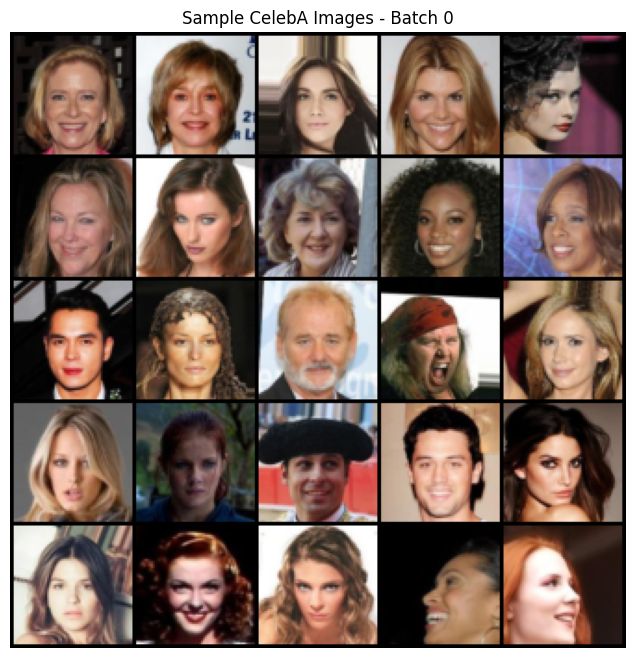

In [ ]:
# Data Hyperparameters
image_size = 64
batch_size = 128

# Load dataset
# dataset = celeba.CelebADataset(root_dir='../data/celeba', transform=data_transform)
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, pin_memory=cuda)

# Display dataset images
def show_images(dataloader, num_images=25, batch_idx=0):
    """Displays a grid of images from the dataloader."""
    for i, (images, _) in enumerate(dataloader):
        if i == batch_idx:
            grid = make_grid(images[:num_images], nrow=5, normalize=True, value_range=(-1, 1))
            plt.figure(figsize=(8, 8))
            plt.imshow(grid.permute(1, 2, 0).cpu().numpy().clip(0, 1))
            plt.axis("off")
            plt.title(f"Sample CelebA Images - Batch {batch_idx}")
            plt.show()
            break

# Display sample images
show_images(dataloader)

torch.Size([3, 64, 64])


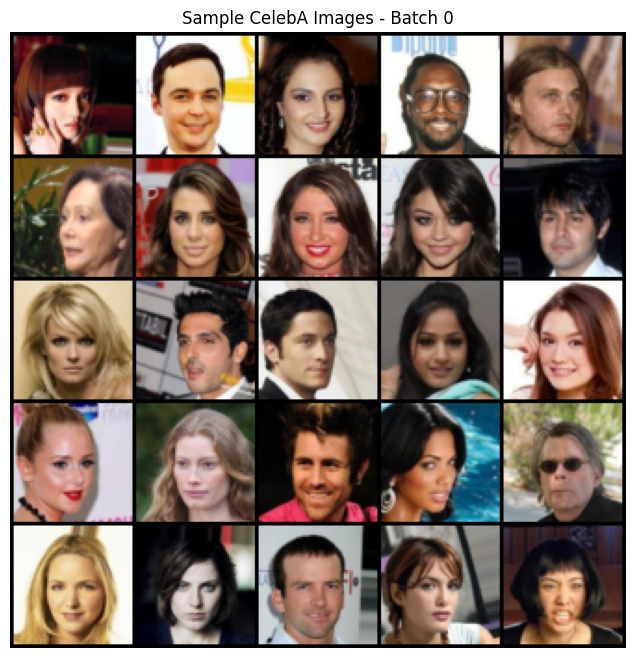

In [ ]:
# Data Hyperparameters
image_size = 64
batch_size = 128

# Load dataset
# dataset = celeba.CelebADataset(root_dir='../data/celeba', transform=data_transform)
print(dataset[0].shape)
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, pin_memory=cuda)

# Display dataset images
def show_images(dataloader, num_images=25, batch_idx=0):
    """Displays a grid of images from the dataloader."""
    for i, images in enumerate(dataloader):
        if i == batch_idx:
            grid = make_grid(images[:num_images], nrow=5, normalize=True, value_range=(-1, 1))
            plt.figure(figsize=(8, 8))
            plt.imshow(grid.permute(1, 2, 0).cpu().numpy().clip(0, 1))
            plt.axis("off")
            plt.title(f"Sample CelebA Images - Batch {batch_idx}")
            plt.show()
            break

# Display sample images
show_images(dataloader)

In [ ]:
class Encoder(nn.Module):
    def __init__(self, input_channels, encoder_feature_maps, latent_dim, image_size):
        """
        Encoder Network for Variational Autoencoder (VAE).

        Parameters:
            input_channels (int): Number of input image channels (e.g., 3 for RGB).
            encoder_feature_maps (int): Number of feature maps in the encoder.
            latent_dim (int): Dimensionality of the latent space.
            image_size (int): Size of input images.
        """
        super(Encoder, self).__init__()

        # Compute the downsampled spatial size
        self.downsampled_size = image_size // 16

        # Convolutional layers for feature extraction
        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, encoder_feature_maps, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(encoder_feature_maps),

            nn.Conv2d(encoder_feature_maps, encoder_feature_maps * 2, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(encoder_feature_maps * 2),

            nn.Conv2d(encoder_feature_maps * 2, encoder_feature_maps * 4, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(encoder_feature_maps * 4),

            nn.Conv2d(encoder_feature_maps * 4, encoder_feature_maps * 8, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # Fully connected layers to map features to latent space (mean & log variance)
        self.mean_layer = nn.Linear(encoder_feature_maps * 8 * self.downsampled_size * self.downsampled_size, latent_dim)
        self.logvar_layer = nn.Linear(encoder_feature_maps * 8 * self.downsampled_size * self.downsampled_size, latent_dim)

    def forward(self, x):
        batch_size = x.size(0)

        # Encode input image into feature maps
        hidden = self.encoder(x).view(batch_size, -1)

        # Compute mean and log variance of latent space
        mean, logvar = self.mean_layer(hidden), self.logvar_layer(hidden)

        return mean, logvar

In [ ]:
class Decoder(nn.Module):
    def __init__(self, input_channels, decoder_feature_maps, latent_dim, image_size):
        """
        Decoder Network for Variational Autoencoder (VAE).

        Parameters:
            input_channels (int): Number of output image channels (e.g., 3 for RGB).
            decoder_feature_maps (int): Number of feature maps in the decoder.
            latent_dim (int): Dimensionality of the latent space.
            image_size (int): Size of generated images.
        """
        super(Decoder, self).__init__()

        self.decoder_feature_maps = decoder_feature_maps
        self.upsampled_size = image_size // 16

        # Fully connected layer to expand latent space to feature maps
        self.decoder_dense = nn.Sequential(
            nn.Linear(latent_dim, decoder_feature_maps * 8 * self.upsampled_size * self.upsampled_size),
            nn.ReLU(inplace=True)
        )

        # Deconvolutional layers to generate images
        self.decoder_conv = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(decoder_feature_maps * 8, decoder_feature_maps * 4, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(decoder_feature_maps * 4),

            nn.Upsample(scale_factor=2),
            nn.Conv2d(decoder_feature_maps * 4, decoder_feature_maps * 2, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(decoder_feature_maps * 2),

            nn.Upsample(scale_factor=2),
            nn.Conv2d(decoder_feature_maps * 2, decoder_feature_maps, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(decoder_feature_maps),

            nn.Upsample(scale_factor=2),
            nn.Conv2d(decoder_feature_maps, input_channels, kernel_size=3, padding=1),
            nn.Tanh()  # Normalize output to [-1,1] range
        )

    def forward(self, latent_vector):
        batch_size = latent_vector.size(0)

        # Expand latent vector to match feature maps
        hidden = self.decoder_dense(latent_vector).view(
            batch_size, self.decoder_feature_maps * 8, self.upsampled_size, self.upsampled_size
        )

        return self.decoder_conv(hidden)

In [ ]:
class VAE(nn.Module):
    def __init__(self, input_channels=3, decoder_feature_maps=32, encoder_feature_maps=32, latent_dim=100, image_size=64):
        """
        Variational Autoencoder (VAE) Model.

        Parameters:
            input_channels (int): Number of image channels (3 for RGB).
            decoder_feature_maps (int): Number of feature maps in the decoder.
            encoder_feature_maps (int): Number of feature maps in the encoder.
            latent_dim (int): Dimensionality of the latent space.
            image_size (int): Input image size.
            device (torch.device, optional): Computation device (CPU/GPU/MPS).
        """
        super(VAE, self).__init__()

        self.latent_dim = latent_dim
        self.device = device

        # Initialize encoder and decoder
        self.encoder = Encoder(input_channels, encoder_feature_maps, latent_dim, image_size)
        self.decoder = Decoder(input_channels, decoder_feature_maps, latent_dim, image_size)

    def forward(self, x):
        """Encodes input x into latent space and reconstructs it."""
        mean, logvar = self.encoder(x)
        latent_z = self.reparametrize(mean, logvar)
        reconstructed_x = self.decode(latent_z)
        return reconstructed_x, mean, logvar

    def encode(self, x):
        """Encodes an input image x into the latent space."""
        mean, logvar = self.encoder(x)
        latent_z = self.reparametrize(mean, logvar)
        return latent_z, mean, logvar

    def decode(self, latent_vector):
        """Decodes a latent vector into an image."""
        return self.decoder(latent_vector)

    @staticmethod
    def reparametrize(mean, logvar):
        """
        Applies the reparameterization trick: z = μ + ϵ * σ.

        Parameters:
            mean (Tensor): Mean of the latent distribution.
            logvar (Tensor): Log variance of the latent distribution.

        Returns:
            Tensor: Sampled latent vector.
        """
        std_dev = torch.exp(0.5 * logvar)
        epsilon = torch.randn_like(std_dev)
        return mean + epsilon * std_dev

    def sample(self, num_samples):
        """
        Generates new images from random noise.

        Parameters:
            num_samples (int): Number of images to generate.

        Returns:
            Tensor: Generated images.
        """
        sample_z = torch.randn(num_samples, self.latent_dim).to(self.device)
        return self.decode(sample_z)

In [ ]:
def loss_function(recon_x, x, mean, logvar, beta=1.0):
    """
    Computes the VAE loss: Reconstruction Loss + KL Divergence.

    Parameters:
        recon_x (Tensor): Reconstructed images.
        x (Tensor): Original images.
        mean (Tensor): Mean of the latent distribution.
        logvar (Tensor): Log variance of the latent distribution.
        beta (float): KL divergence scaling factor (default: 1.0 for standard VAE).

    Returns:
        mse_loss (Tensor): Mean Squared Error loss (Reconstruction).
        kld_loss (Tensor): KL Divergence loss.
    """
    batch_size = recon_x.shape[0]

    # Mean Squared Error (Reconstruction Loss) - Normalized per batch
    mse_loss = F.mse_loss(recon_x.view(batch_size, -1), x.view(batch_size, -1), reduction='sum') / batch_size

    # KL Divergence Loss - Normalized per batch
    kld_loss = -0.5 * torch.sum(1 + logvar - mean.pow(2) - torch.clamp(logvar.exp(), min=1e-8)) / batch_size

    # Apply beta scaling (for β-VAE)
    kld_loss *= beta

    return mse_loss, kld_loss

In [ ]:
def train_vae(model, dataloader, optimizer, scheduler, epochs, device, log_interval=50):
    """
    Trains a Variational Autoencoder (VAE) model.

    Parameters:
        model (nn.Module): The VAE model.
        dataloader (torch.utils.data.DataLoader): Dataloader for training.
        optimizer (torch.optim.Optimizer): Optimizer for training.
        scheduler (torch.optim.lr_scheduler._LRScheduler): Learning rate scheduler.
        epochs (int): Number of training epochs.
        device (torch.device): Computation device (CPU/GPU/MPS).
        log_interval (int): Number of batches between progress updates (default: 50).

    Returns:
        dict: Dictionary containing lists of recorded loss values over training.
    """
    model.to(device)
    model.train()

     # Initialize loss tracking
    loss_history = {
        "total_loss": [],
        "mse_loss": [],
        "kl_loss": [],
        "steps": []
    }

    with tqdm(total=epochs * len(dataloader), desc="Training Progress") as pbar:
        for epoch in range(1, epochs + 1):
            epoch_loss, epoch_mse, epoch_kld = 0, 0, 0

            for batch_idx, data in enumerate(dataloader):
                data = data.to(device)
                optimizer.zero_grad()

                # Forward pass
                recon_batch, mean, logvar = model(data)

                # Compute losses
                mse_loss, kld_loss = loss_function(recon_batch, data, mean, logvar)
                loss = mse_loss + kld_loss

                # Backpropagation
                loss.backward()
                optimizer.step()

                # Track losses
                epoch_loss += loss.item()
                epoch_mse += mse_loss.item()
                epoch_kld += kld_loss.item()

                # Save loss values at log intervals
                if batch_idx % log_interval == 0:
                    loss_history["total_loss"].append(loss.item() / len(data))
                    loss_history["mse_loss"].append(mse_loss.item() / len(data))
                    loss_history["kl_loss"].append(kld_loss.item() / len(data))
                    loss_history["steps"].append(epoch + batch_idx / len(dataloader))

                    pbar.set_description(
                        f"Epoch [{epoch}/{epochs}] | KL: {kld_loss.item()/len(data):.4f} | MSE: {mse_loss.item()/len(data):.4f}"
                    )

                # Update progress bar every `log_interval` steps
                if batch_idx % log_interval == 0:
                    pbar.set_description(
                        f"Epoch [{epoch}/{epochs}] | KL: {kld_loss.item()/len(data):.4f} | MSE: {mse_loss.item()/len(data):.4f}"
                    )
                pbar.update(1)

            # Compute average losses per epoch
            avg_loss = epoch_loss / len(dataloader.dataset)
            avg_mse = epoch_mse / len(dataloader.dataset)
            avg_kld = epoch_kld / len(dataloader.dataset)

            print(f"\nEpoch {epoch}/{epochs} | Avg Loss: {avg_loss:.4f} | Avg MSE: {avg_mse:.4f} | Avg KL: {avg_kld:.4f}")

            # Adjust learning rate
            scheduler.step()

            # Generate and visualize sample images after each epoch
            with torch.no_grad():
                sample_images = model.sample(64).cpu()
                image_grid = make_grid(sample_images, normalize=True)

                plt.figure(figsize=(8, 8))
                plt.imshow(image_grid.permute(1, 2, 0))
                plt.axis("off")
                plt.title(f"Generated Samples (Epoch {epoch})")
                plt.show()

    return loss_history

Epoch [1/10] | KL: 1.1985 | MSE: 3.4335:  10%|▉         | 1581/15820 [02:25<21:47, 10.89it/s] 


Epoch 1/10 | Avg Loss: 5.5805 | Avg MSE: 4.4742 | Avg KL: 1.1062


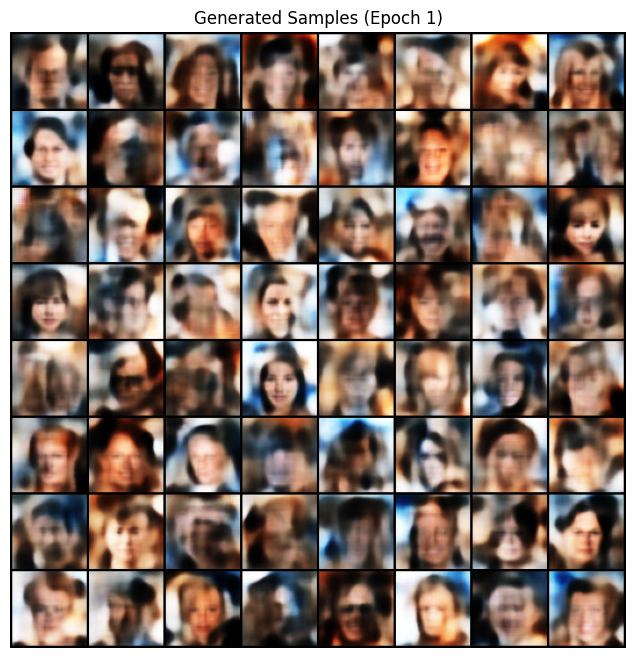

Epoch [2/10] | KL: 1.0589 | MSE: 3.0208:  20%|██        | 3164/15820 [15:35<18:47, 11.23it/s]    


Epoch 2/10 | Avg Loss: 4.1130 | Avg MSE: 2.9979 | Avg KL: 1.1151


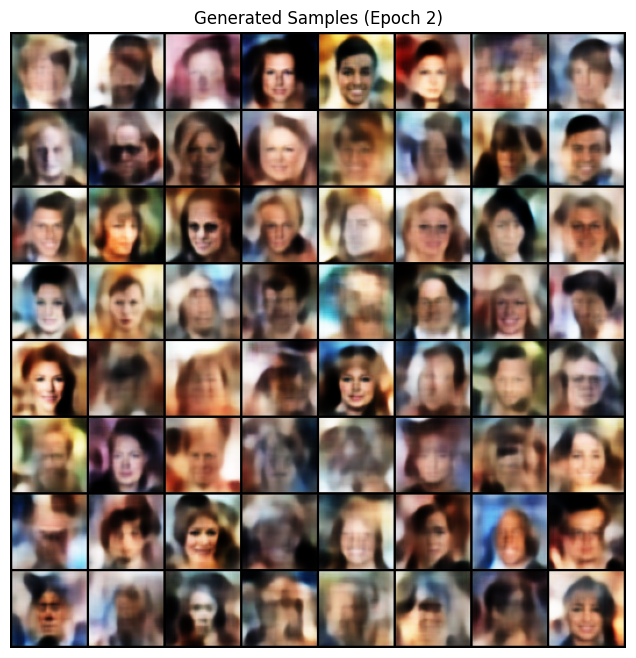

Epoch [3/10] | KL: 1.0908 | MSE: 2.7446:  30%|███       | 4746/15820 [17:56<16:05, 11.47it/s]


Epoch 3/10 | Avg Loss: 3.8358 | Avg MSE: 2.7422 | Avg KL: 1.0936


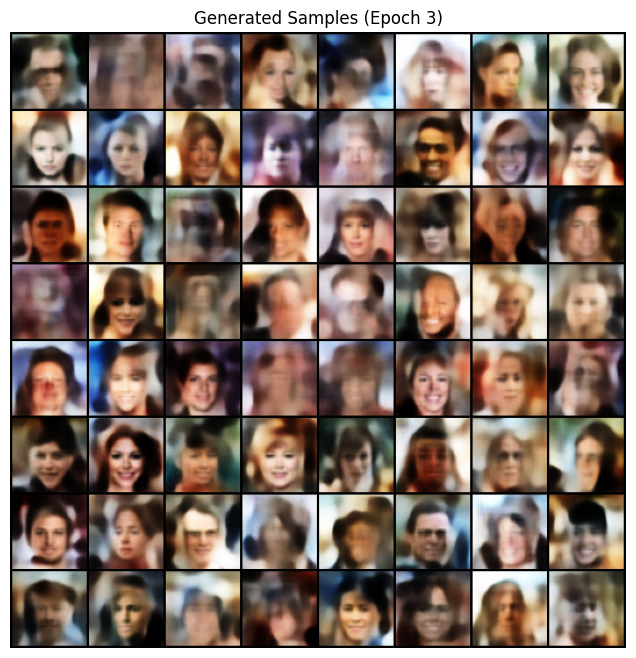

Epoch [4/10] | KL: 1.0725 | MSE: 2.7095:  40%|████      | 6328/15820 [20:18<14:16, 11.09it/s]


Epoch 4/10 | Avg Loss: 3.7050 | Avg MSE: 2.6281 | Avg KL: 1.0769


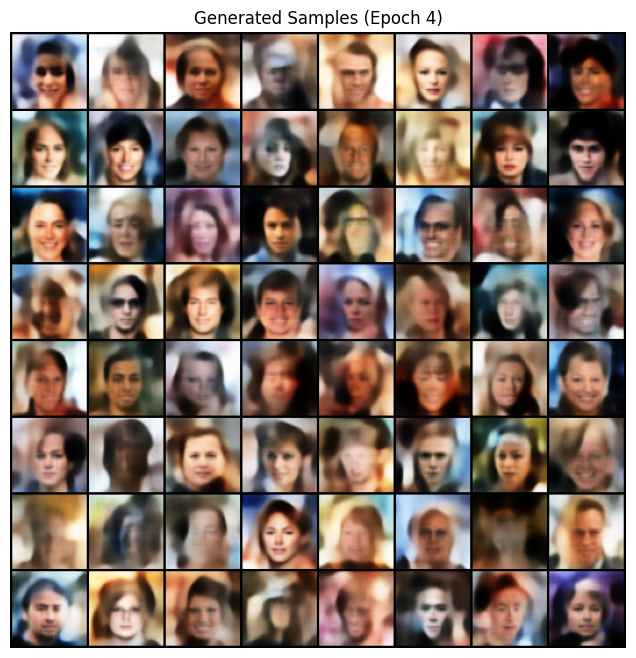

Epoch [5/10] | KL: 1.0690 | MSE: 2.6639:  50%|█████     | 7910/15820 [22:37<11:36, 11.36it/s]


Epoch 5/10 | Avg Loss: 3.6123 | Avg MSE: 2.5453 | Avg KL: 1.0671


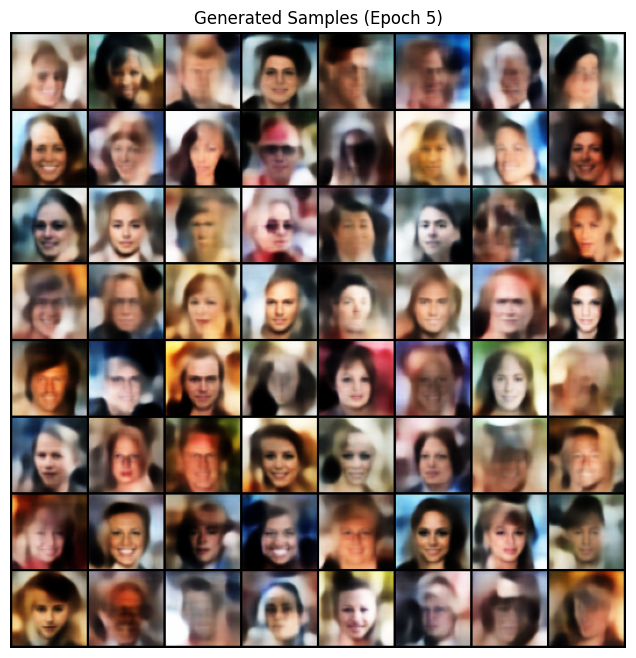

Epoch [6/10] | KL: 1.0877 | MSE: 2.4284:  60%|██████    | 9492/15820 [24:56<09:08, 11.53it/s]


Epoch 6/10 | Avg Loss: 3.5413 | Avg MSE: 2.4794 | Avg KL: 1.0620


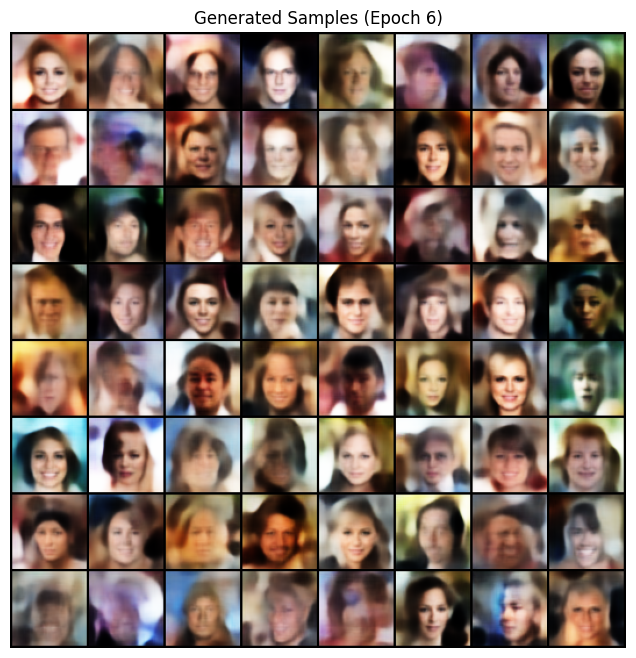

Epoch [7/10] | KL: 1.0618 | MSE: 2.4374:  70%|███████   | 11074/15820 [29:11<06:55, 11.43it/s]   


Epoch 7/10 | Avg Loss: 3.4820 | Avg MSE: 2.4223 | Avg KL: 1.0597


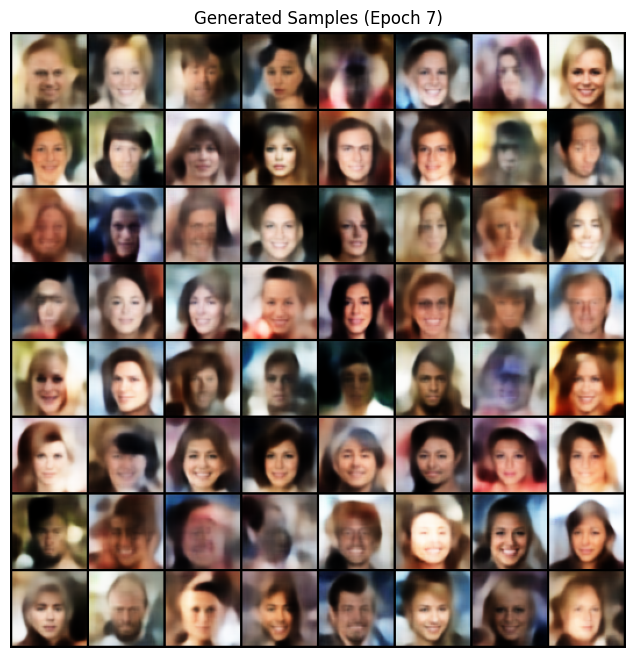

Epoch [8/10] | KL: 1.0499 | MSE: 2.5020:  80%|████████  | 12656/15820 [31:31<04:39, 11.32it/s]


Epoch 8/10 | Avg Loss: 3.4309 | Avg MSE: 2.3722 | Avg KL: 1.0587


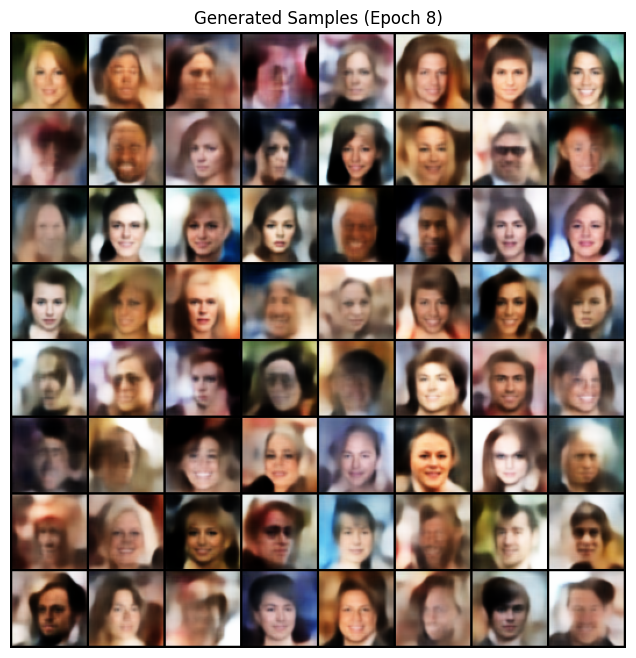

Epoch [9/10] | KL: 1.0619 | MSE: 2.4988:  90%|█████████ | 14238/15820 [33:50<02:21, 11.21it/s]


Epoch 9/10 | Avg Loss: 3.3932 | Avg MSE: 2.3347 | Avg KL: 1.0586


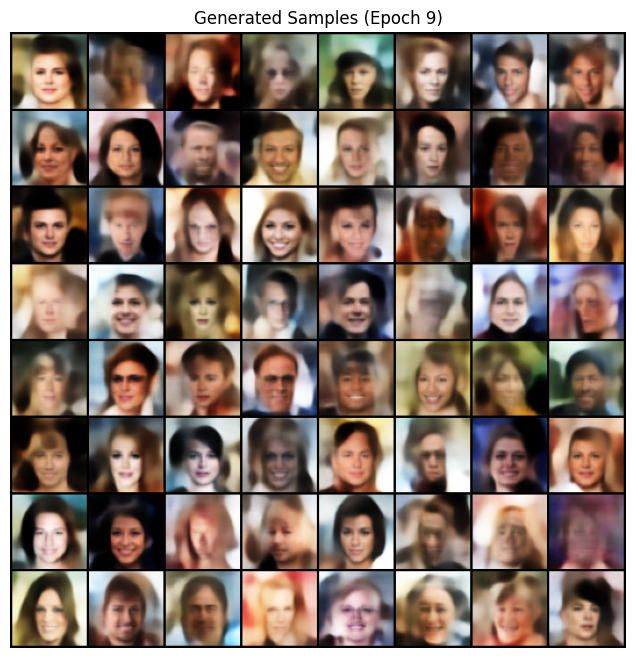

Epoch [10/10] | KL: 1.0612 | MSE: 2.2905: 100%|██████████| 15820/15820 [36:15<00:00, 11.43it/s]


Epoch 10/10 | Avg Loss: 3.3718 | Avg MSE: 2.3129 | Avg KL: 1.0589


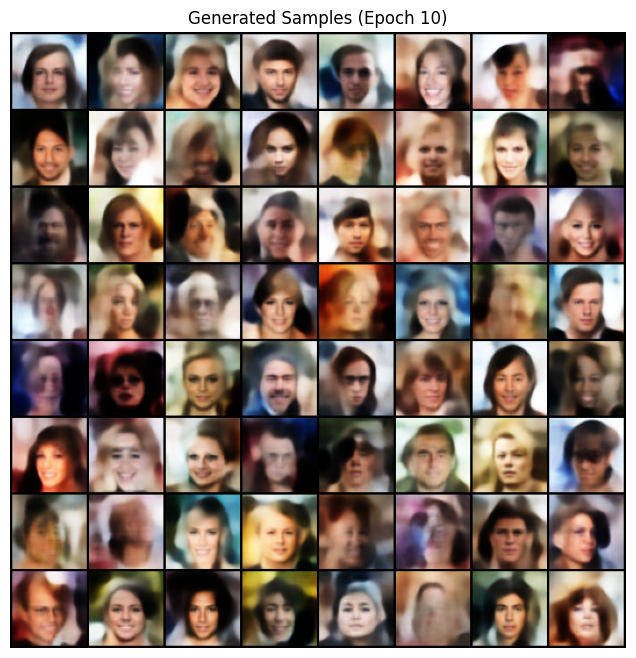

Epoch [10/10] | KL: 1.0612 | MSE: 2.2905: 100%|██████████| 15820/15820 [36:15<00:00,  7.27it/s]


In [ ]:
# Training Hyperparameters
epochs = 10
lr = 1e-3

# Initialize Model, Optimizer & Scheduler
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

# Train the VAE
loss_history = train_vae(model, dataloader, optimizer, scheduler, epochs=epochs, device=device)

In [ ]:
torch.save(model.state_dict(), "model_vae.pth")

In [282]:
from collections import defaultdict

def get_representations(dataloader, model, device):
    model.to(device)
    representations = defaultdict(list)
    for image, cl in tqdm(dataloader, leave=False):
        print(image.shape)
        c = cl["attributes"][:, 20]
        ima = image.to(device)
        print(ima.shape)
        p = torch.stack(model.encode(ima))
        p = p.permute(1, 0, 2)  

        print(p.shape)
        # print(p.flatten().detach())
        # representations[c].append(p.flatten().detach())
        # break
        print(len(p))
        for i in range(len(p)):
            # im = image[i].to(device)
            # print(im.shape)
            # t = model.encode(im)
            # print(p[i])
            
            representations[c[i].item()].append(p[i].flatten().detach())
            # print(i)
            # print(representations[-1])
    return representations

In [286]:
from torch.utils.data import Subset, DataLoader

subset = Subset(dataset, indices=range(5000))
dataloader_2 = torch.utils.data.DataLoader(dataset=subset, batch_size=batch_size, shuffle=True, pin_memory=cuda)
representations = get_representations(dataloader_2, model, device)
# assert len(representations) == 10
# assert len(representations[0]) == 1000
# assert type(representations[0][0]) == torch.Tensor
# assert representations[0][0].shape <= (256, )

  8%|▊         | 3/40 [00:00<00:03, 11.88it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 12%|█▎        | 5/40 [00:00<00:02, 12.58it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 22%|██▎       | 9/40 [00:00<00:02, 12.97it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 28%|██▊       | 11/40 [00:00<00:02, 12.61it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 38%|███▊      | 15/40 [00:01<00:01, 13.17it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 42%|████▎     | 17/40 [00:01<00:01, 12.87it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 52%|█████▎    | 21/40 [00:01<00:01, 12.62it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 57%|█████▊    | 23/40 [00:01<00:01, 12.82it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 68%|██████▊   | 27/40 [00:02<00:01, 12.98it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 72%|███████▎  | 29/40 [00:02<00:00, 13.04it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 82%|████████▎ | 33/40 [00:02<00:00, 12.58it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 88%|████████▊ | 35/40 [00:02<00:00, 12.82it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128


 98%|█████████▊| 39/40 [00:03<00:00, 12.76it/s]

torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 64, 64])
torch.Size([128, 3, 100])
128
torch.Size([8, 3, 64, 64])
torch.Size([8, 3, 64, 64])


torch.Size([8, 3, 100])
8


In [287]:
print(representations.keys())

dict_keys([1, -1])


In [288]:
print(len(representations[-1]))

2917


In [ ]:
from scipy.linalg import sqrtm
from copy import deepcopy, copy



def calculate_fid(repr1, repr2):
    repr1 = [tensor.to("cpu") for tensor in repr1]
    repr2 = [tensor.to("cpu") for tensor in repr2]
    repr1 = np.array(copy(repr1)).astype(np.float64)
    repr1 = np.array([a.flatten() for a in repr1])
    repr2 = np.array(copy(repr2)).astype(np.float64)
    repr2 = np.array([a.flatten() for a in repr2])
    mu_1 = np.average(repr1, axis=0)
    mu_2 = np.average(repr2, axis=0)

    unbiased_1 = repr1 - mu_1
    unbiased_2 = repr2 - mu_2

    mean_diff = np.sum((mu_1 - mu_2) ** 2)
    matr_1 = unbiased_1.T @ unbiased_1 / (len(repr1) - 1)
    matr_2 = unbiased_2.T @ unbiased_2 / (len(repr2) - 1)
    return mean_diff + np.trace(matr_1) + np.trace(matr_2) - 2 * np.trace(sqrtm(matr_1 @ matr_2))


FID  between males and females
NB! (I get this idea from classmate and liked it, since many classes are inequal it seems a logical choice to select closely matched males and females and getting FID for all possible classes (2^40 is too much))

In [290]:
calculate_fid(representations[-1], representations[1])

np.float64(17.743623334270637)

### Задача 3 (6/10 балла). 

#### Задача 3.1 (4/10 балла) Построить и обучить VAPNEV на CelebA

Здесь нужно прочитать [статью про VAPNEV](https://arxiv.org/pdf/1611.05209.pdf), обучить его до нормального (трешхолды будут позже) качества, померить FID и запомнить для будущего сравнения. 

#### Задача 3.2 (2/10 балла). Построить и обучить conditional VAPNEV на CelebA

Вроде понятно из текста задачи. Что такое conditional VAPNEV, читайте в статье

In [ ]:
# YOUR CODE HERE

### Задача 4. (1/10 балла) Анализ

* Анализ латентного пространства и визуально качественный результат - **1 балл**
1. Посмотрите у какой модели получается лучшая интерполяция в латентном пространстве
2. Попробуйте взять внешнюю картинку (не из селебы), отмапить ее с латентное пространство и покажите ближайшие к ней.
3. Покажите самый смешной результат генерации который у вас получался

In [ ]:
# YOUR CODE HERE

### Задача 0. Отчет

Чтобы получить полный балл за каждый из пунктов вам нужно включить в отчет (который сдатеся отдельно в виде pdf) примеры (лучше - много примеров) генерации вашей модели. 

Сравните результаты разных моделей, попробуйте обьяснить почему одна сработала лучше чем другая.